In [1]:
# OCR 모델
!pip install easyocr
# 이미지 영상 처리
!pip install opencv-python
# PyTorch와 torchvision 설치
!pip install torch torchvision torchaudio
# matplotlib 설치
!pip install matplotlib
# GUI 없는 환경에서 OpenCV 사용을 위해
!pip install opencv-python-headless
# clone
!git clone https://github.com/ultralytics/yolov5

fatal: destination path 'yolov5' already exists and is not an empty directory.


requirements: Ultralytics requirement ['pillow>=10.3.0'] not found, attempting AutoUpdate...
requirements:  AutoUpdate skipped (offline)


Using cache found in C:\Users\peter/.cache\torch\hub\ultralytics_yolov5_master
YOLOv5  2024-5-1 Python-3.12.2 torch-2.2.1+cpu CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 
image 1/1: 3024x4032 1 person, 1 book
Speed: 337.2ms pre-process, 512.0ms inference, 29.6ms NMS per image at shape (1, 3, 480, 640)


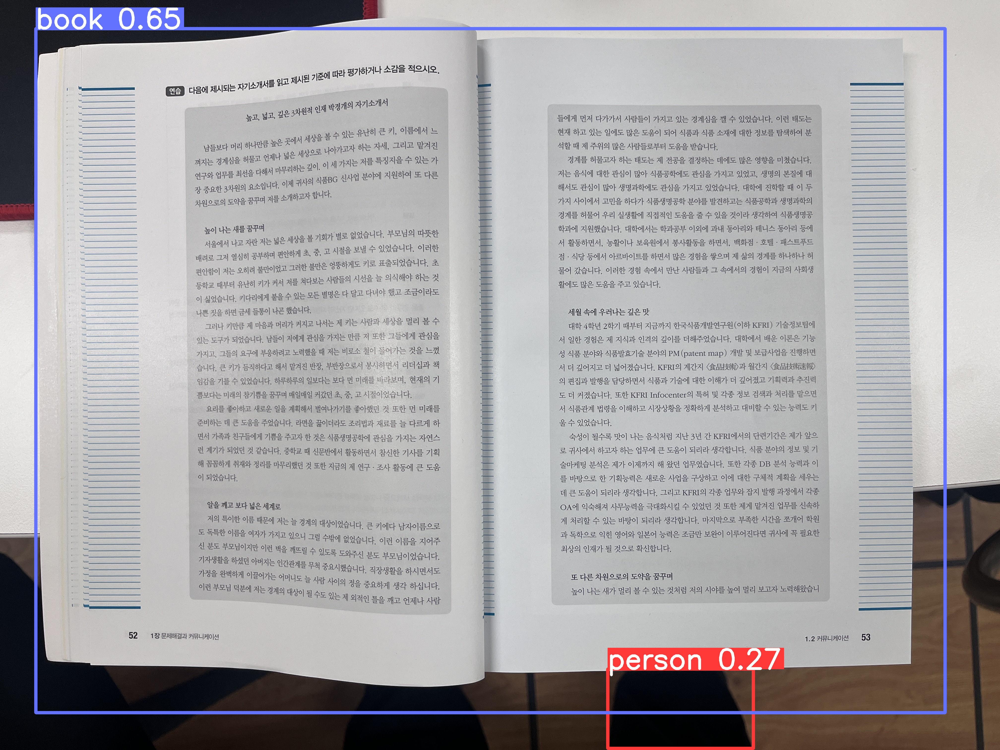

In [8]:
import torch
import os

# Model
model = torch.hub.load("ultralytics/yolov5", "yolov5s")  # or yolov5n - yolov5x6, custom

# Images
img_path = "C:\\Users\\peter\\capstone\\camera\\test5.jpg"  # or file, Path, PIL, OpenCV, numpy, list

# Inference
results = model(img_path)

# Results
results.print()  # or .show(), .save(), .crop(), .pandas(), etc.
results.show()

In [6]:
%pwd

'C:\\Users\\peter\\capstone'

In [10]:
import torch
from PIL import Image

# 모델 로드
model = torch.hub.load("ultralytics/yolov5", "yolov5s")  # YOLOv5 모델 버전 선택

# 이미지 경로
img_path = "C:\\Users\\peter\\capstone\\camera\\test5.jpg"

# 추론 수행
results = model(img_path)

# detected된 모든 객체를 pandas 데이터프레임 형태로 변환
df = results.pandas().xyxy[0]

# 'book' 클래스의 객체들만 필터링
book_df = df[df['name'] == 'book']

# confidence가 가장 높은 'book' 객체 찾기
if not book_df.empty:
    highest_conf_row = book_df.loc[book_df['confidence'].idxmax()]
    
    # 이미지 로드
    img = Image.open(img_path)
    
    # 바운딩 박스로 이미지 자르기
    cropped = img.crop((int(highest_conf_row['xmin']), int(highest_conf_row['ymin']), int(highest_conf_row['xmax']), int(highest_conf_row['ymax'])))
    
    # 자른 이미지의 너비와 높이 구하기
    width, height = cropped.size
    
    # 이미지를 가로로 반으로 나누기
    left_half = cropped.crop((0, 0, width/2, height))
    right_half = cropped.crop((width/2, 0, width, height))
    
    # 나눠진 이미지 파일 저장
    left_half_path = 'C:\\Users\\peter\\capstone\\onePage\\left_page.jpg'
    right_half_path = 'C:\\Users\\peter\\capstone\\onePage\\right_page.jpg'
    left_half.save(left_half_path)
    right_half.save(right_half_path)
else:
    print("탐지된 'book'이 없습니다.")

requirements: Ultralytics requirement ['pillow>=10.3.0'] not found, attempting AutoUpdate...
requirements:  AutoUpdate skipped (offline)


Using cache found in C:\Users\peter/.cache\torch\hub\ultralytics_yolov5_master
YOLOv5  2024-5-1 Python-3.12.2 torch-2.2.1+cpu CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


In [11]:
import cv2
import easyocr
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont
import numpy as np

# easyocr Reader 생성 (한국어와 영어 인식을 위해 'ko'와 'en'을 설정)
reader = easyocr.Reader(['ko', 'en'], gpu=False)

# 이미지 경로
left_half_path = 'C:\\Users\\peter\\capstone\\onePage\\left_page.jpg'
right_half_path = 'C:\\Users\\peter\\capstone\\onePage\\right_page.jpg'

# 이미지 읽기
left_img = cv2.imread(left_half_path)
right_img = cv2.imread(right_half_path)

# 텍스트를 저장할 리스트 초기화
recognized_texts = []

# 왼쪽 이미지에서 텍스트 인식 및 바운드 박스 그리기
result_left = reader.readtext(left_img)
for (bbox, text, prob) in result_left:
    # 인식된 텍스트를 리스트에 추가
    recognized_texts.append(text)
    # 바운드 박스 좌표 추출 및 그리기
    (top_left, top_right, bottom_right, bottom_left) = bbox
    top_left = (int(top_left[0]), int(top_left[1]))
    bottom_right = (int(bottom_right[0]), int(bottom_right[1]))
    cv2.rectangle(left_img, top_left, bottom_right, (0, 255, 0), 2)

# 왼쪽 이미지 저장 및 표시
cv2.imwrite('C:\\Users\\peter\\capstone\\onePage\\left_page.jpg', left_img)
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(left_img, cv2.COLOR_BGR2RGB))
plt.title("Left Page with Bounding Boxes")
plt.axis('off')
plt.show()

# 오른쪽 이미지에서 텍스트 인식 및 바운드 박스 그리기
result_right = reader.readtext(right_img)
for (bbox, text, prob) in result_right:
    # 인식된 텍스트를 리스트에 추가
    recognized_texts.append(text)
    # 바운드 박스 좌표 추출 및 그리기
    (top_left, top_right, bottom_right, bottom_left) = bbox
    top_left = (int(top_left[0]), int(top_left[1]))
    bottom_right = (int(bottom_right[0]), int(bottom_right[1]))
    cv2.rectangle(right_img, top_left, bottom_right, (0, 255, 0), 2)

# 오른쪽 이미지 저장 및 표시
cv2.imwrite('C:\\Users\\peter\\capstone\\onePage\\right_page.jpg', right_img)
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(right_img, cv2.COLOR_BGR2RGB))
plt.title("Right Page with Bounding Boxes")
plt.axis('off')
plt.show()

# 인식된 텍스트 리스트 출력
print("인식된 텍스트들:")
for text in recognized_texts:
    print(text)


Using CPU. Note: This module is much faster with a GPU.


인식된 텍스트들:
따라 평기하거나 소감을 적으시오.
기준에
잎고
연습
다음에 제시되는
인재
자기소개서
표고 넓고 깊은
'볼수 잇는 유난히 근 키 이름에서 느
남들보다 머리 하나만큼 높은
(생로-날 요자 하논자씨 그리고 말휘진 
꺼지논 경계심올 허물고 언제나 넓은 세상요로
(세가지논 저률 특징지올 수 잇는가
'최선올 다해서 마무리하논 깊이 이
연구와 업무름
식품BG 신사업 분아에 지원하여 또 다른
장 중요한 3차원의 요소입니다: 이제
차원오로의 도약올꿈꾸려 저흘소개하고자 한니다:
높이 나는 새틀 꿈꾸떠
별로 없/습니다: 부모님의 따뜻한
서울에서 나고 자관 저논 넓은 세상올 불기회가 ,
(편안하게 초 중; 고 시절올 보볕 수 잇있습니다: 이러한
배려로 그저 열심히 공부하다
(불만이없고 그러한 불만-은 엉뚱하제도 키로 표출되없습니다: 초
편안합이 저논 오히려
'메부터 유난히 키가 귀서 저물 쳐다보는 사람들의 시선올 늘 의식해야 하는 것
등학교
이
심없습니다 키다리애계 붙음수 잇는 모든 별명은 다 달고 다녀야 햇고 조금이라도
나뿐 짓올 하면 금세 들둥이 나곤 햇습니다:
그러나 키만큼 제 마음과 머리가 커지고 나서는 제 키논 사람과 세상올 멀리 볼 수
잇는 도구가 되엇습니다: 남들이 저예제 관심올 가지논 만큼 저 또한 그들에게 관심올
가지고 그들의 요구에 부응하려고 노력햇올 때 저논 비로소 철이 들어가는 것올 느낌
습니다 군 키가 등직하다고 해서 맡겨진 반장; 부반장으로서 봉사하면서 리더심과 책
임감올 기틀 수 있있습니다. 하루하루의 일보다는 보다 먼 미래틀 바라보다. 현재의 기
뿐보다는 미래의 참기쁨올 꿈구다 매일매일 커자던 초 중; 고 시절이없습니다.
요리블 좋아하고 새로운 일올 계획해서 벌여나가기틀 좋아햇년 것 또한 먼 미래틀
준비하는 데 근 도움올 주없습니다: 라면올 끓이더라도 조리법과 재료틀 늘 다르게 하
면서 가족과 친구들에제 기쁨을 주고자 한 것은 식품생명공학에 관심올 가지는 자연스
권 게기가 되있면 것 같습니다. 중학교 때 신문반에서 활동하면서 참신한 기

In [12]:
import cv2
import easyocr
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont
import numpy as np

# easyocr Reader 생성 (한국어와 영어 인식을 위해 'ko'와 'en'을 설정)
reader = easyocr.Reader(['ko', 'en'], gpu=False)

# 이미지 경로
path = 'C:\\Users\\peter\\capstone\\camera\\test1.jpg'

# 이미지 읽기
img = cv2.imread(path)

# 텍스트를 저장할 리스트 초기화
recognized_texts = []

# 왼쪽 이미지에서 텍스트 인식 및 바운드 박스 그리기
result = reader.readtext(img)

for (bbox, text, prob) in result:
    # 인식된 텍스트를 리스트에 추가
    recognized_texts.append(text)
    # 바운드 박스 좌표 추출 및 그리기
    (top_left, top_right, bottom_right, bottom_left) = bbox
    top_left = (int(top_left[0]), int(top_left[1]))
    bottom_right = (int(bottom_right[0]), int(bottom_right[1]))
    cv2.rectangle(left_img, top_left, bottom_right, (0, 255, 0), 2)

# 왼쪽 이미지 저장 및 표시
cv2.imwrite('C:\\Users\\peter\\capstone\\camera\\test1.jpg', img)
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title("Page with Bounding Boxes")
plt.axis('off')
plt.show()

# 인식된 텍스트 리스트 출력
print("인식된 텍스트들:")
for text in recognized_texts:
    print(text)

Using CPU. Note: This module is much faster with a GPU.


인식된 텍스트들:
모든 것이 비틀거렇다. 바다는 짙고 뜨거운 바람을 몰고 앞
다 하늘이 활짝 열리고 불이 비 오듯 쏟아지는 것 같앉다
내 몸 전체가 긴장햇고 나는 권충올 움켜잡앉다. 방아쇠가
당거적다: 나는 권총 손잡이의 반들반들한 배름 만큼다 단
호하고 귀름 명하게 하는 소음으로부터 모든 것이 시작되
없다 나는 땀과 태양올 털어내없다. 한낮의 균형과 행복올
느껴년 해변의 이레적인 침묵올 내가 깨뜨덧다는 것올 깨
날있다. 그때 나는 움직임이 없는 몸둥이 위로 네 방울 다시
쓰앉다 총단은 깊이 박혀 보이지도 않있다 이것은 마치 불
행의 문을 두드리는 네 번의 잘막한 노크 소리와도 같있다:
itcooly
6eesmt
